# PREDICTIVE MAINTENANCE: DAMAGE PROPAGATION MODELING FOR AIRCRAFT ENGINE RUN-TO-FAILURE PREDICTION

#### IMPORTING THE REQUIRED LIBRARIES

In [1]:
import pandas as pd # Importing pandas library and aliasing it as pd
import numpy as np # Importing numpy library and aliasing it as np
import time # tracks time for a certain operation
import psutil # tracks cpu usage
import threading # allows continous monitoring
from sklearn.model_selection import train_test_split, cross_val_score, KFold # splitting the dataset
import matplotlib.pyplot as plt # Importing pyplot module from matplotlib library and aliasing it as plt
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, Normalizer, MaxAbsScaler # for data scaling and normalization
from imblearn.over_sampling import RandomOverSampler # the oversampler
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor # extreme gradient boost
from sklearn.ensemble import GradientBoostingRegressor # gradient boost
from sklearn.tree import DecisionTreeRegressor # decision tree model
from sklearn.ensemble import RandomForestRegressor # random forest
import seaborn as sns # Importing seaborn library and aliasing it as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
import warnings
warnings.filterwarnings("ignore")

# Configure Jupyter Notebook
pd.set_option('display.max_columns', None)   # Setting pandas option to display all columns in DataFrame
pd.set_option('display.max_rows', 500) 
plt.style.use('ggplot')  # Setting plot style to 'ggplot' from matplotlib

#### IMPORTING THE TRAIN DATASET

In [2]:
# Load the train dataset
train_data = pd.read_csv("train_FD004.txt", delim_whitespace=True, header=None)
train_data.columns = ['unit_number', 'time_in_cycles', 'operational_setting_1', 
                      'operational_setting_2', 'operational_setting_3'] + [f'sensor_{i}' for i in range(1, 22)]

#### LOADING THE RUL FILE

In [3]:
# Load the RUL data
rul_file_path = "RUL_FD004.txt"  # Replace with your file path
rul_data = pd.read_csv(rul_file_path, header=None, names=['RUL'], delim_whitespace=True)

#### LOOKING AT THE DATASET

In [4]:
train_data.head()

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,5.70,137.36,2211.86,8311.32,1.01,41.69,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,13.61,332.10,2323.66,8713.60,1.07,43.94,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,5.69,138.18,2211.92,8306.69,1.01,41.66,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,5.70,137.98,2211.88,8312.35,1.02,41.68,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,9.00,174.82,1915.22,7994.94,0.93,36.48,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754


In [5]:
train_data.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
unit_number,61249.0,124.325181,71.995350,1.0000,60.0000,126.0000,185.0000,249.0000
time_in_cycles,61249.0,134.311417,89.783389,1.0000,62.0000,123.0000,191.0000,543.0000
operational_setting_1,61249.0,23.999823,14.780722,0.0000,10.0046,25.0014,41.9981,42.0080
operational_setting_2,61249.0,0.571347,0.310703,0.0000,0.2507,0.7000,0.8400,0.8420
operational_setting_3,61249.0,94.031576,14.251954,60.0000,100.0000,100.0000,100.0000,100.0000
sensor_1,61249.0,472.882435,26.436832,445.0000,445.0000,462.5400,491.1900,518.6700
sensor_2,61249.0,579.420056,37.342647,535.4800,549.3300,555.7400,607.0700,644.4200
sensor_3,61249.0,1417.896600,106.167598,1242.6700,1350.5500,1367.6800,1497.4200,1613.0000
sensor_4,61249.0,1201.915359,119.327591,1024.4200,1119.4900,1136.9200,1302.6200,1440.7700
sensor_5,61249.0,8.031626,3.622872,3.9100,3.9100,7.0500,10.5200,14.6200


### NON LINEAR RELATIONSHIPS BETWEEN THE SENSORS

In [6]:
sns.set_context("notebook", font_scale=1.2)  
sns.set_style("whitegrid") 

# Generate pairplot with increased aspect ratio and more spacing
g = sns.pairplot(train_data, diag_kind='kde', height=3, aspect=1.2)  

# Adjust spacing between plots
g.fig.subplots_adjust(wspace=0.3, hspace=0.3)

plt.show()

### EXPLORATORY DATA ANALYSIS

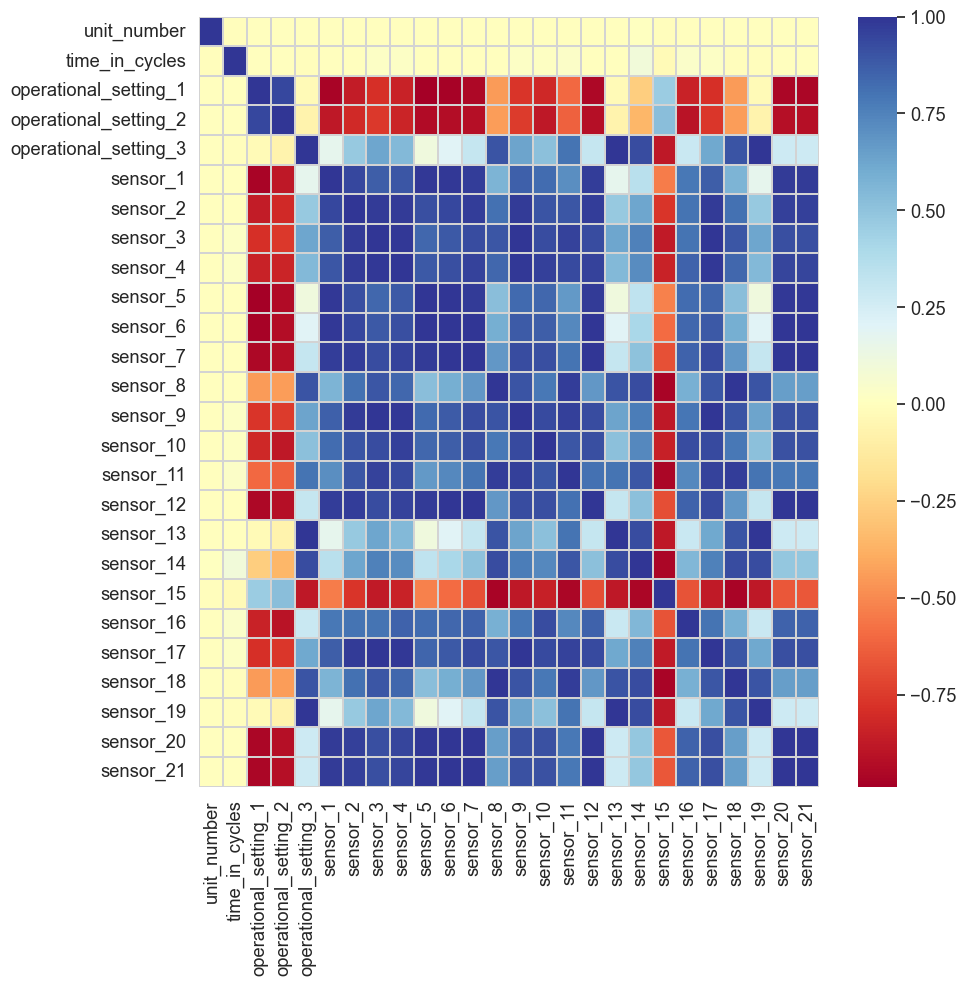

In [7]:
plt.figure(figsize=(10,10))

sns.set_style("whitegrid", {"axes.facecolor": ".0"})

df_cluster2 = train_data.corr()

sns.heatmap(df_cluster2,
            cmap='RdYlBu',
            annot=False, 
            linewidths=0.2, 
            linecolor='lightgrey').set_facecolor('white')

plt.show()

#### CREATING THE TRAIN RUL

The Remaining useful life (RUL) is calculated as the difference between the maximum cycle for each engine and the current cycle.

In [6]:
# define the maximum life of each engine, as this could be used to obtain the RUL at each point in time of the engine's life 
df_train_RUL = train_data.groupby(['unit_number']).agg({'time_in_cycles':'max'})
df_train_RUL.rename(columns={'time_in_cycles':'life'},inplace=True)
df_train_RUL.head()

,life
unit_number,
1,321
2,299
3,307
4,274
5,193


In [7]:
train_data = train_data.merge(df_train_RUL,how='left',on=['unit_number'])

In [8]:
train_data['RUL'] = train_data['life'] - train_data['time_in_cycles']
train_data.drop(['life'],axis=1,inplace=True)

# the RUL prediction is only useful nearer to the end of the engine's life, therefore we put an upper limit on the RUL
# this is a bit sneaky, since it supposes that the test set has RULs of less than this value, the closer you are
# to the true value, the more accurate the model will be

train_data['RUL'][train_data['RUL']>125]=125

#### LOOKING AT THE DATA 

In [9]:
train_data.head()

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,RUL
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,5.70,137.36,2211.86,8311.32,1.01,41.69,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670,125
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,13.61,332.10,2323.66,8713.60,1.07,43.94,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552,125
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,5.69,138.18,2211.92,8306.69,1.01,41.66,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213,125
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,5.70,137.98,2211.88,8312.35,1.02,41.68,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176,125
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,9.00,174.82,1915.22,7994.94,0.93,36.48,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754,125


### PLOTTING THE SENSOR OUTPUTS FOR ALL SENSORS BEFORE SMOOTHING

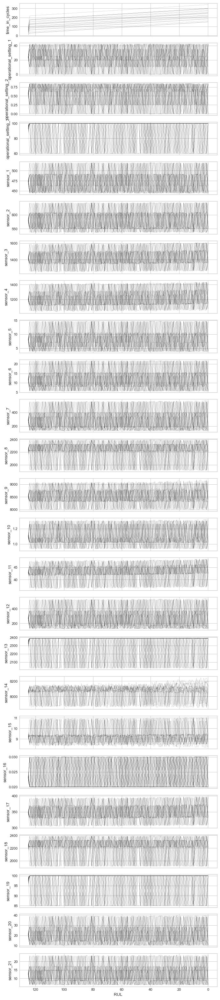

In [11]:
plt.style.use('seaborn-v0_8-whitegrid') 
plt.rcParams['figure.figsize']=8,40 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 8
plt.rcParams['lines.linewidth'] = 0.1
plot_items = list(train_data.columns)[1:-1]
fig,ax = plt.subplots(len(plot_items),sharex=True)
ax[0].invert_xaxis()

engines = list(train_data['unit_number'].unique())

for engine in engines[10:30]:
    for i,item in enumerate(plot_items):
        f = sns.lineplot(data=train_data[train_data['unit_number']==engine],x='RUL',y=item,color='black',ax=ax[i])

In [12]:
# Looking at the dataset properties
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61249 entries, 0 to 61248
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   unit_number            61249 non-null  int64  
 1   time_in_cycles         61249 non-null  int64  
 2   operational_setting_1  61249 non-null  float64
 3   operational_setting_2  61249 non-null  float64
 4   operational_setting_3  61249 non-null  float64
 5   sensor_1               61249 non-null  float64
 6   sensor_2               61249 non-null  float64
 7   sensor_3               61249 non-null  float64
 8   sensor_4               61249 non-null  float64
 9   sensor_5               61249 non-null  float64
 10  sensor_6               61249 non-null  float64
 11  sensor_7               61249 non-null  float64
 12  sensor_8               61249 non-null  float64
 13  sensor_9               61249 non-null  float64
 14  sensor_10              61249 non-null  float64
 15  se

#### CHECKING FOR MISSING VALUES

In [12]:
# Counting missing values in each column
missing_values_count = train_data.isnull().sum()

# Calculating the proportion of missing values for each column
missing_values_proportion= train_data.isnull().sum() / len(train_data)

# Combining count and proportion into one DataFrame for a clean summary
missing_values_summary = pd.DataFrame({
    'Missing Values': missing_values_count,
    'Proportion': missing_values_proportion
})
# Displaying the summary table
print(missing_values_summary)

                       Missing Values  Proportion
unit_number                         0         0.0
time_in_cycles                      0         0.0
operational_setting_1               0         0.0
operational_setting_2               0         0.0
operational_setting_3               0         0.0
sensor_1                            0         0.0
sensor_2                            0         0.0
sensor_3                            0         0.0
sensor_4                            0         0.0
sensor_5                            0         0.0
sensor_6                            0         0.0
sensor_7                            0         0.0
sensor_8                            0         0.0
sensor_9                            0         0.0
sensor_10                           0         0.0
sensor_11                           0         0.0
sensor_12                           0         0.0
sensor_13                           0         0.0
sensor_14                           0         0.0


### EXPONENTIAL MOVING AVERAGE SMOOTHING

In [13]:
# Parameters for smoothing
ema_span = 5 

In [14]:
# Apply smoothing techniques to all numerical columns
df_smoothed = train_data.copy()

for col in train_data.select_dtypes(include=['number']).columns:
    df_smoothed[f'{col}_ema'] = train_data[col].ewm(span=ema_span, adjust=False).mean()

In [15]:
data = df_smoothed

### SENSORS VISUALIZATION AFTER SMOOTHING

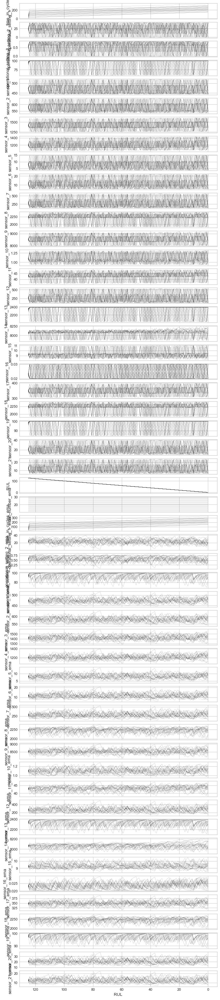

In [19]:
plt.style.use('seaborn-v0_8-whitegrid') 
plt.rcParams['figure.figsize']=8,40 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 8
plt.rcParams['lines.linewidth'] = 0.1
plot_items = list(data.columns)[1:-1]
fig,ax = plt.subplots(len(plot_items),sharex=True)
ax[0].invert_xaxis()

engines = list(data['unit_number'].unique())

for engine in engines[10:30]:
    for i,item in enumerate(plot_items):
        f = sns.lineplot(data=data[data['unit_number']==engine],x='RUL',y=item,color='black',ax=ax[i])

## FEATURE EXTRACTION

In [16]:
Selected_Features = []

import statsmodels.api as sm

def backward_regression(X, y, initial_list=[], threshold_out=0.05, verbose=True):
    """To select feature with Backward Stepwise Regression 

    Args:
        X -- features values
        y -- target variable
        initial_list -- features header
        threshold_out -- pvalue threshold of features to drop
        verbose -- true to produce lots of logging output

    Returns:
        list of selected features for modeling 
    """
    included = list(X.columns)
    while True:
        changed = False
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max()  # null if pvalues is empty
        if worst_pval > threshold_out:
            changed = True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print(f"worst_feature : {worst_feature}, {worst_pval} ")
        if not changed:
            break
    Selected_Features.append(included)
    print(f"\nSelected Features:\n{Selected_Features[0]}")

In [17]:
# Application of the backward regression function on our training data
X = data.iloc[:,1:-1]
y = data.iloc[:,-1]

In [18]:
backward_regression(X, y)

worst_feature : sensor_8_ema, 0.9539286198379072 
worst_feature : sensor_8, 0.8819329991919327 
worst_feature : sensor_14_ema, 0.7880951522861392 
worst_feature : sensor_6_ema, 0.3950795268985656 
worst_feature : sensor_13_ema, 0.4351912818863475 
worst_feature : sensor_21_ema, 0.3412328675277577 
worst_feature : sensor_20_ema, 0.19136862436901783 
worst_feature : sensor_19, 0.10191306718903943 
worst_feature : sensor_19_ema, 0.25311081752542475 
worst_feature : sensor_14, 0.09584002387583872 
worst_feature : operational_setting_1_ema, 0.08559373929019659 
worst_feature : sensor_18_ema, 0.8368403726357875 
worst_feature : operational_setting_1, 0.41213790496301805 
worst_feature : sensor_13, 0.0748587527703092 

Selected Features:
['time_in_cycles', 'operational_setting_2', 'operational_setting_3', 'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5', 'sensor_6', 'sensor_7', 'sensor_9', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_15', 'sensor_16', 'sensor_17', 'sensor_18', 'se

In [19]:
Selected_Features

[['time_in_cycles',
  'operational_setting_2',
  'operational_setting_3',
  'sensor_1',
  'sensor_2',
  'sensor_3',
  'sensor_4',
  'sensor_5',
  'sensor_6',
  'sensor_7',
  'sensor_9',
  'sensor_10',
  'sensor_11',
  'sensor_12',
  'sensor_15',
  'sensor_16',
  'sensor_17',
  'sensor_18',
  'sensor_20',
  'sensor_21',
  'RUL',
  'unit_number_ema',
  'time_in_cycles_ema',
  'operational_setting_2_ema',
  'operational_setting_3_ema',
  'sensor_1_ema',
  'sensor_2_ema',
  'sensor_3_ema',
  'sensor_4_ema',
  'sensor_5_ema',
  'sensor_7_ema',
  'sensor_9_ema',
  'sensor_10_ema',
  'sensor_11_ema',
  'sensor_12_ema',
  'sensor_15_ema',
  'sensor_16_ema',
  'sensor_17_ema']]

In [20]:
feature_names = Selected_Features[0]
np.shape(X)

(61249, 52)

### DATA SPLITTING AND NORMALIZATION

In machine learning, data can be inputed in several magnitudes and sometimes it may hinder the model from learning some important data points or features correctly, with such a problem, the need to normalize or standardize our data becomes of utmost importance. Normalization is a technique used to transform the features of a dataset into a common scale, that is to represent the datapoints magnitude within a common range so that the machine learning is not influenced by the disproportional datapoints helping the data to converge faster and perform better.

In [21]:
# splits the data into dependent and independent variables
X = data[feature_names]
y = data.iloc[:,-1]

In [22]:
# splits the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=46)

In [23]:
# scaling the faetures
scaler = StandardScaler()

# fit the scaler to the train data
X_train = scaler.fit_transform(X_train)

# fit the scaler to the test data
X_test = scaler.transform(X_test)

## LINEAR REGRESSION 

In [24]:
# initialize the decision trees classifier
LR = LinearRegression()

# start tracking the CPU usage and time
cpu_percentage = []
start_time = time.time()

# creating a function to track the average cpu
def cpu_tracker(interval=0.1):
    while True:
        cpu_percentage.append(psutil.cpu_percent(interval=interval))
        
# start CPU tracking in a separate thread
tracker_thread = threading.Thread(target=cpu_tracker)
tracker_thread.start()

# fit and train the model
LR.fit(X_train, y_train)

# end the time tracker
end_time = time.time()

# stop CPU tracking
tracker_thread.join(timeout=0)

# calculate time taken and average CPU usage
training_time = end_time - start_time
average_CPU_usage = sum(cpu_percentage) / len(cpu_percentage) if cpu_percentage else 0

In [25]:
print(f"Time taken to train the model: {training_time:.2f} seconds")
print(f"Average CPU usage during training: {average_CPU_usage:.2f}%")

Time taken to train the model: 0.11 seconds
Average CPU usage during training: 60.70%


#### EVALUATING THE LINEAR REGRESSION MODEL

In [26]:
# evaluate the model predictions
y_pred = LR.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

Mean squared error: 3.71
Mean absolute error: 0.87
R2 score: 1.00
Mean absolute percentage error: 0.02


In [27]:
print('R-squared error: '+ "{:.2%}".format(LR.score(X_test,y_test)))
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

R-squared error: 99.77%
Root Mean Squared Error: 1.93


#### VISUALIZATION OF RESULTS

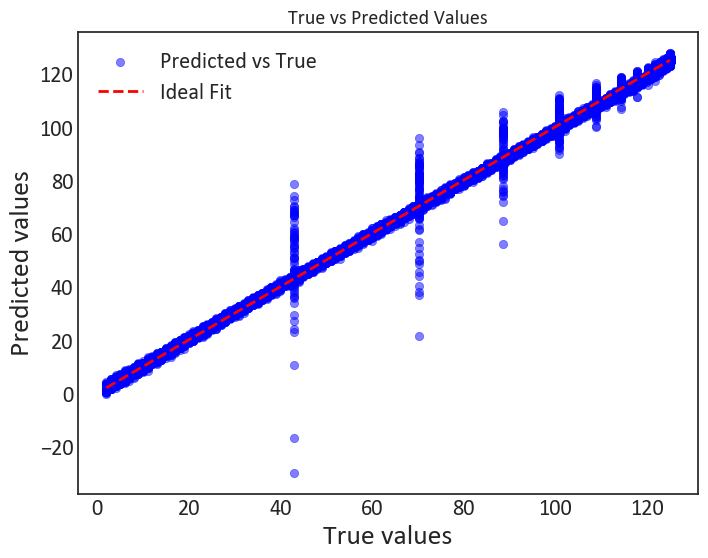

In [29]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Predicted vs True')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('True vs Predicted Values')
plt.legend() 
plt.show()

### RANDOM FOREST REGRESSOR

In [30]:
rf_model = RandomForestRegressor()

# start tracking the CPU usage and time
cpu_percentage = []
start_time = time.time()

# creating a function to track the average cpu
def cpu_tracker(interval=0.1):
    while True:
        cpu_percentage.append(psutil.cpu_percent(interval=interval))
        
# start CPU tracking in a separate thread
tracker_thread = threading.Thread(target=cpu_tracker)
tracker_thread.start()

rf_model.fit(X_train, y_train)

# end the time tracker
end_time = time.time()

# stop CPU tracking
tracker_thread.join(timeout=0)

# calculate time taken and average CPU usage
training_time = end_time - start_time
average_CPU_usage = sum(cpu_percentage) / len(cpu_percentage) if cpu_percentage else 0

In [31]:
print(f"Time taken to train the model: {training_time:.2f} seconds")
print(f"Average CPU usage during training: {average_CPU_usage:.2f}%")

Time taken to train the model: 211.38 seconds
Average CPU usage during training: 45.68%


#### EVALUATING THE RANDOM FOREST MODEL

In [32]:
# evaluate the model predictions
y_pred = rf_model.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

Mean squared error: 0.10
Mean absolute error: 0.00
R2 score: 1.00
Mean absolute percentage error: 0.00


In [33]:
print('R-squared error: '+ "{:.2%}".format(rf_model.score(X_test,y_test)))
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

R-squared error: 99.99%
Root Mean Squared Error: 0.31


#### VISUALIZATION OF RESULTS

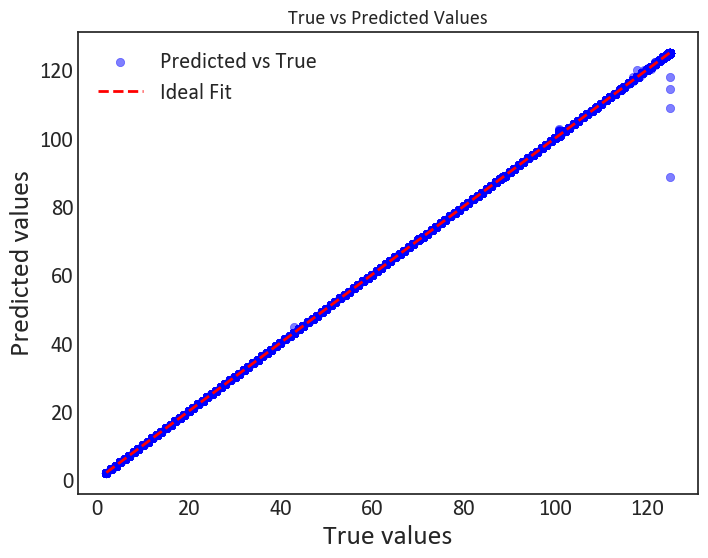

In [35]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Predicted vs True')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('True vs Predicted Values')
plt.legend() 
plt.show()

### EXTREME GRADIENT BOOSTING  MODEL

In [36]:
xgb_model = XGBRegressor(objective='reg:squarederror', learning_rate=0.1, random_state=46)

# start tracking the CPU usage and time
cpu_percentage = []
start_time = time.time()

# creating a function to track the average cpu
def cpu_tracker(interval=0.1):
    while True:
        cpu_percentage.append(psutil.cpu_percent(interval=interval))
        
# start CPU tracking in a separate thread
tracker_thread = threading.Thread(target=cpu_tracker)
tracker_thread.start()

xgb_model.fit(X_train, y_train)

# end the time tracker
end_time = time.time()

# stop CPU tracking
tracker_thread.join(timeout=0)

# calculate time taken and average CPU usage
training_time = end_time - start_time
average_CPU_usage = sum(cpu_percentage) / len(cpu_percentage) if cpu_percentage else 0

In [37]:
print(f"Time taken to train the model: {training_time:.2f} seconds")
print(f"Average CPU usage during training: {average_CPU_usage:.2f}%")

Time taken to train the model: 3.27 seconds
Average CPU usage during training: 99.83%


#### EVALUATING THE XGBOOST MODEL

In [38]:
# evaluate the model predictions
y_pred = xgb_model.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

Mean squared error: 1.05
Mean absolute error: 0.08
R2 score: 1.00
Mean absolute percentage error: 0.00


In [39]:
print('R-squared error: '+ "{:.2%}".format(xgb_model.score(X_test,y_test)))
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

R-squared error: 99.93%
Root Mean Squared Error: 1.03


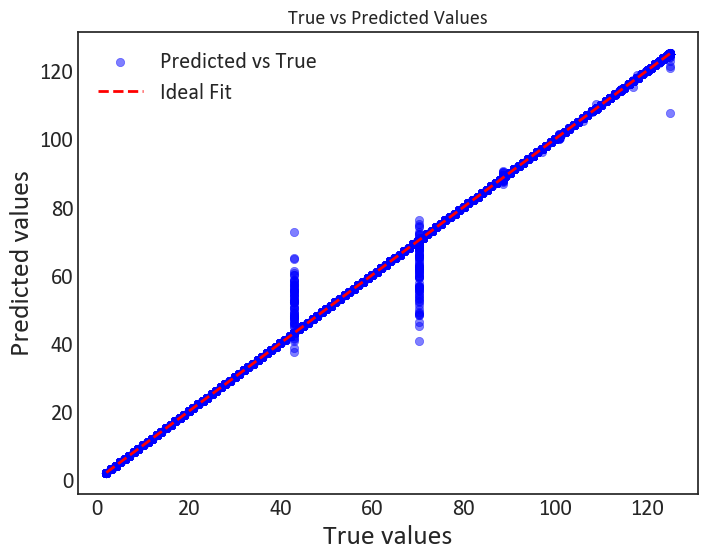

In [41]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Predicted vs True')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('True vs Predicted Values')
plt.legend() 
plt.show()

## DEEP LEARNING IMPLEMENTATION

In [42]:
import tensorflow as tf # importing the neural network framework with alias tf
from tensorflow.keras.models import Sequential # activating the linear layers of the neural network
from tensorflow.keras.layers import Dense # activating the dense and fully connected layer of the neural network
from tensorflow.keras import layers, Input, Model
from tensorflow.keras.layers import SimpleRNN, Dropout, LSTM # RNN, LSTM and dropout 
from tensorflow.keras.optimizers import Adam, AdamW # adam optimizer

## ARTIFICIAL NEURAL NETWORK (ANN)

In [43]:
# define the neural netwrok model
model = Sequential([
    Dense(64, input_shape=(X_train.shape[1],), activation = 'relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1) # output layer for regression
])

In [44]:
# model compilation
model.compile(optimizer='adam',
             loss='mse',
             metrics=['mse'])

In [45]:
# model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │           2,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,121 (20.00 KB)

 Trainable params: 5,121 (20.00 KB)

 Non-trainable params: 0 (0.00 B)

#### SPLITTING THE DATA FURTHER FOR DEEP LEARNING

In [46]:
# splits the data into train sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=46)

# splits the data into test and validation sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=46)

# scaling the faetures
scaler = StandardScaler()

# fit the scaler to the train data
X_train = scaler.fit_transform(X_train)

# fit the scaler to the test data
X_test = scaler.transform(X_test)

# fit the scaler to the validation data
X_val = scaler.transform(X_val)

In [47]:
# start tracking the CPU usage and time
cpu_percentage = []
start_time = time.time()

# creating a function to track the average cpu
def cpu_tracker(interval=0.1):
    while True:
        cpu_percentage.append(psutil.cpu_percent(interval=interval))
        
# start CPU tracking in a separate thread
tracker_thread = threading.Thread(target=cpu_tracker)
tracker_thread.start()

# train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)

# end the time tracker
end_time = time.time()

# stop CPU tracking
tracker_thread.join(timeout=0)

Epoch 1/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 3072.2739 - mse: 3072.2739 - val_loss: 36.1454 - val_mse: 36.1454
Epoch 2/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 28.6679 - mse: 28.6679 - val_loss: 10.1426 - val_mse: 10.1426
Epoch 3/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.4004 - mse: 9.4004 - val_loss: 5.2097 - val_mse: 5.2097
Epoch 4/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 5.1349 - mse: 5.1349 - val_loss: 4.0801 - val_mse: 4.0801
Epoch 5/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 4.4755 - mse: 4.4755 - val_loss: 3.5433 - val_mse: 3.5433
Epoch 6/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 4.2570 - mse: 4.2570 - val_loss: 3.2680 - val_mse: 3.2680
Epoch 7/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 4.0096 - mse: 4.0096 - val_loss: 4.2377 - val_mse: 4.2377
Epoch 8/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 3.6726 - mse: 3.6726 - val_loss: 3.8871 - val_mse: 3.8871
Epoch 9/10
1149/1149 ━━━━━━━

#### VISUALIZE THE TRAIN MSE AND LOSS PROGRESS

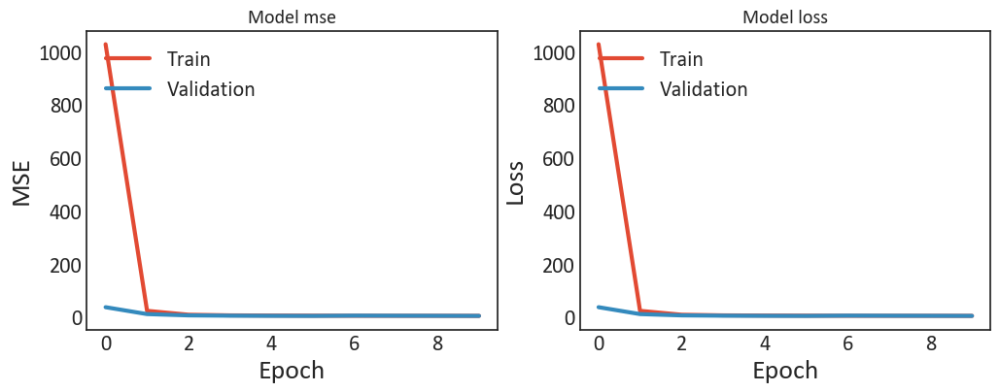

In [48]:
# plot training and validation mse
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.title('Model mse')
plt.ylabel('MSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# plot training and validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

#### EVALUATE ANN

In [49]:
# evaluate the model predictions
y_pred = model.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

383/383 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Mean squared error: 3.44
Mean absolute error: 1.00
R2 score: 1.00
Mean absolute percentage error: 0.02


In [50]:
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

Root Mean Squared Error: 1.85


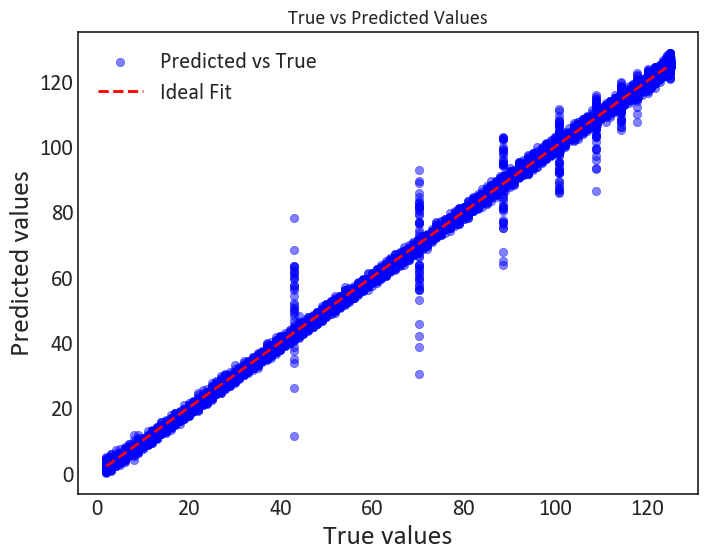

In [51]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Predicted vs True')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('True vs Predicted Values')
plt.legend() 
plt.show()

## CONVOLUTIONAL NEURAL NETWORK (CNN)

In [52]:
num_features = X_train.shape[1]

In [53]:
# write model architecture
model = Sequential([
    layers.Conv1D(filters=128, kernel_size=3, activation='relu', 
                  input_shape=(num_features, 1)),
    
    layers.MaxPool1D(pool_size=2),
    
    layers.Conv1D(filters=64, kernel_size=3, activation='relu'),
    
    layers.MaxPool1D(pool_size=2),
    
    layers.Conv1D(filters=32, kernel_size=3, activation='relu'),
    
    layers.Flatten(),
    
    layers.Dense(64, activation='relu'),
    
    layers.Dense(1) # output layer for regression
])

In [54]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 36, 128)             │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 18, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 16, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 8, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 6, 32)               │           6,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │          12,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 43,745 (170.88 KB)

 Trainable params: 43,745 (170.88 KB)

 Non-trainable params: 0 (0.00 B)

In [55]:
# compile the model and optimizer
model.compile(optimizer='adam',
              loss='mse', 
              metrics=['mse'])

In [56]:
# start tracking the CPU usage and time
cpu_percentage = []
start_time = time.time()

# creating a function to track the average cpu
def cpu_tracker(interval=0.1):
    while True:
        cpu_percentage.append(psutil.cpu_percent(interval=interval))
        
# start CPU tracking in a separate thread
tracker_thread = threading.Thread(target=cpu_tracker)
tracker_thread.start()

# train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)

# end the time tracker
end_time = time.time()

# stop CPU tracking
tracker_thread.join(timeout=0)

Epoch 1/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1926.7317 - mse: 1926.7317 - val_loss: 54.2547 - val_mse: 54.2547
Epoch 2/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 57.2352 - mse: 57.2352 - val_loss: 43.9337 - val_mse: 43.9337
Epoch 3/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 49.3939 - mse: 49.3939 - val_loss: 34.0135 - val_mse: 34.0135
Epoch 4/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 35.2996 - mse: 35.2996 - val_loss: 14.2228 - val_mse: 14.2228
Epoch 5/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 16.1656 - mse: 16.1656 - val_loss: 12.3034 - val_mse: 12.3034
Epoch 6/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 11.6577 - mse: 11.6577 - val_loss: 8.7993 - val_mse: 8.7993
Epoch 7/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 11.3762 - mse: 11.3762 - val_loss: 21.0142 - val_mse: 21.0142
Epoch 8/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 9.6038 - mse: 9.6038 - val_loss: 11.9836 - val_mse: 11.9836
Epoc

#### VISUALIZE THE MSE AND LOSS TREND

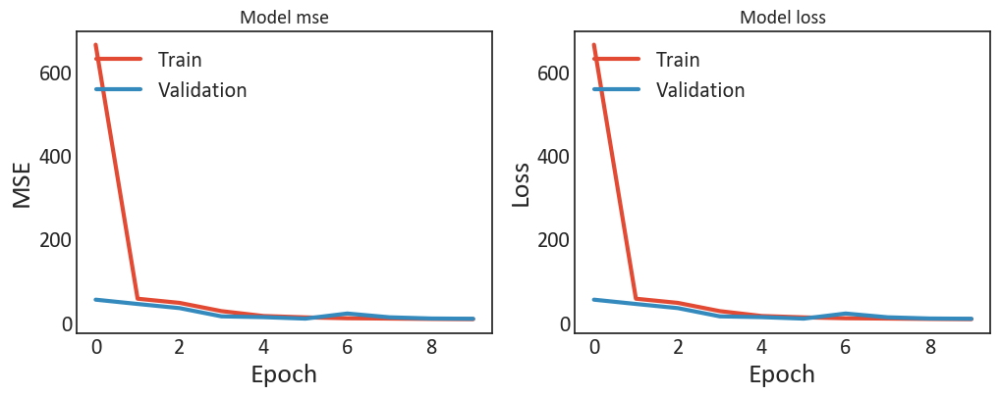

In [57]:
# plot training and validation mse
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.title('Model mse')
plt.ylabel('MSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# plot training and validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

#### EVALUATE THE CNN

In [58]:
# evaluate the model predictions
y_pred = model.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

383/383 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Mean squared error: 8.57
Mean absolute error: 2.30
R2 score: 0.99
Mean absolute percentage error: 0.04


In [59]:
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

Root Mean Squared Error: 2.93


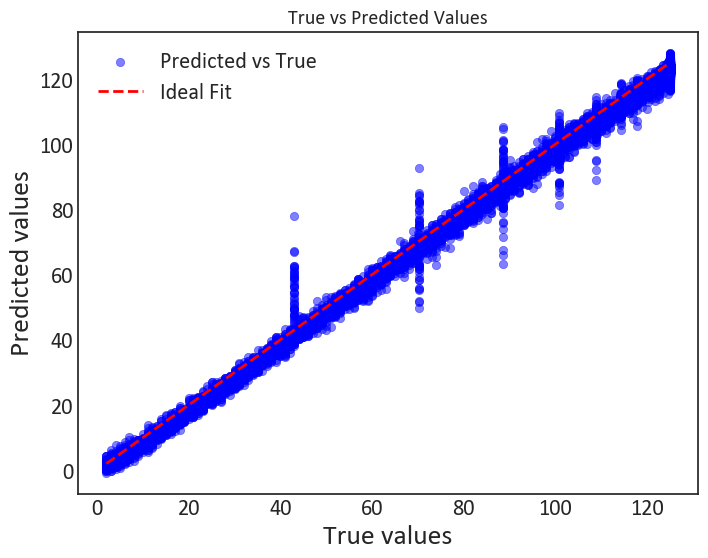

In [60]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Predicted vs True')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('True vs Predicted Values')
plt.legend() 
plt.show()

# DATA PREPARATION FOR THE LSTM  MODEL

In [61]:
X_train_reshaped = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_val_reshaped = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
X_test_reshaped = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

## LONG SHORT TERM MEMORY(LSTM)

In [62]:
from tensorflow import keras
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping

In [63]:
initial_learning_rate = 0.1
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

In [64]:
model = keras.Sequential()
model.add(LSTM(100,  
                return_sequences=True,
               input_shape=(1,X_train.shape[1])
              ))
model.add(BatchNormalization())
model.add(LSTM(50,
                return_sequences=True,
               activation='tanh'
              ))
model.add(Dropout(0.5))
model.add(LSTM(10,
             return_sequences=True,
               activation='tanh',
              ))
model.add(Dropout(0.5))
model.add(Dense(100,
               activation='relu',
              ))
model.add(Dense(1))

In [65]:
model.compile(loss = "mse", optimizer = tf.keras.optimizers.Adam(learning_rate=0.001))

In [66]:
# Model summary
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 1, 100)              │          55,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1, 100)              │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 1, 50)               │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1, 50)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 1, 10)               │           2,440 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1, 10)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 1, 100)              │           1,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1, 1)                │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 89,841 (350.94 KB)

 Trainable params: 89,641 (350.16 KB)

 Non-trainable params: 200 (800.00 B)

In [67]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=4, min_lr=1e-7, verbose=1)

In [68]:
# start tracking the CPU usage and time
cpu_percentage = []
start_time = time.time()

# creating a function to track the average cpu
def cpu_tracker(interval=0.1):
    while True:
        cpu_percentage.append(psutil.cpu_percent(interval=interval))
        
# start CPU tracking in a separate thread
tracker_thread = threading.Thread(target=cpu_tracker)
tracker_thread.start()

# train the model
history = model.fit(X_train_reshaped, y_train, 
                        validation_data=(X_val_reshaped, y_val), 
                        epochs=10, 
                        batch_size=32, 
                        callbacks=[reduce_lr])

# end the time tracker
end_time = time.time()

# stop CPU tracking
tracker_thread.join(timeout=0)

Epoch 1/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - loss: 4537.6787 - val_loss: 96.8446 - learning_rate: 0.0010
Epoch 2/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 565.7869 - val_loss: 43.3792 - learning_rate: 0.0010
Epoch 3/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 226.9840 - val_loss: 38.8915 - learning_rate: 0.0010
Epoch 4/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 120.2568 - val_loss: 39.2360 - learning_rate: 0.0010
Epoch 5/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 83.4725 - val_loss: 41.9063 - learning_rate: 0.0010
Epoch 6/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 64.7775 - val_loss: 38.2115 - learning_rate: 0.0010
Epoch 7/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 56.5228 - val_loss: 46.6941 - learning_rate: 0.0010
Epoch 8/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 51.9310 - val_loss: 53.9412 - learning_rate: 0.0010
Epoch 9/10
1149/1149 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - loss: 47.5894 - val_loss: 

#### EVALUATE LSTM

In [69]:
# Make predictions on the test set
y_pred = model.predict(X_test_reshaped)

# Flatten the predictions and true values to 1D arrays
y_pred = y_pred.ravel()  # Ensures the shape is 1D
y_test = y_test.ravel()  # Assuming y_test is your true values and needs to be 1D

383/383 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


In [70]:
# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

Mean squared error: 62.47
Mean absolute error: 6.61
R2 score: 0.96
Mean absolute percentage error: 0.12


In [71]:
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

Root Mean Squared Error: 7.90


#### VISUALIZE LSTM 

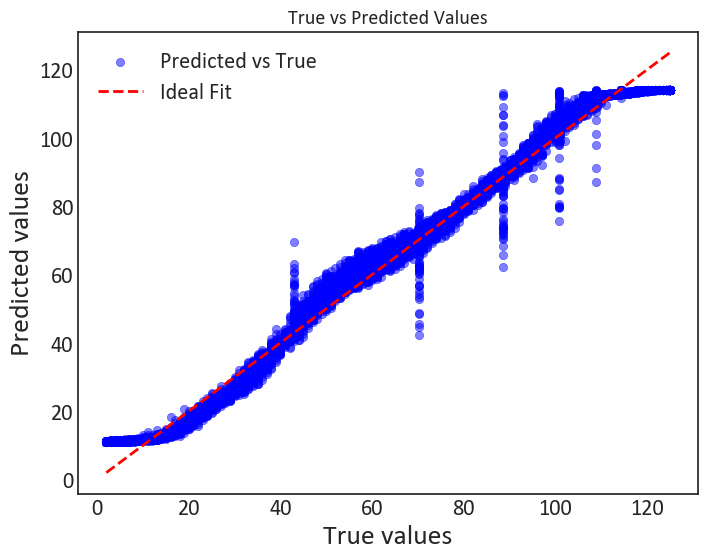

In [72]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Predicted vs True')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('True vs Predicted Values')
plt.legend() 
plt.show()

## HYBRID MODEL OF ANN AND CNN

In [73]:
# Define input shape 
num_features = X_train.shape[1]

# Shared Input for both ANN and CNN
input_layer = Input(shape=(num_features,))

# ANN Branch
ann_branch = layers.Dense(128, activation='relu')(input_layer)
ann_branch = layers.BatchNormalization()(ann_branch)
ann_branch = layers.Dropout(0.3)(ann_branch)
ann_branch = layers.Dense(64, activation='relu')(ann_branch)
ann_branch = layers.Dense(32, activation='relu')(ann_branch)

# CNN Branch
cnn_input = layers.Reshape((num_features, 1))(input_layer)  # Reshape for Conv1D
cnn_branch = layers.Conv1D(filters=256, kernel_size=3, activation='relu')(cnn_input)
cnn_branch = layers.MaxPool1D(pool_size=2)(cnn_branch)
cnn_branch = layers.Conv1D(filters=128, kernel_size=3, activation='relu')(cnn_branch)
cnn_branch = layers.MaxPool1D(pool_size=2)(cnn_branch)
cnn_branch = layers.Conv1D(filters=64, kernel_size=3, activation='relu')(cnn_branch)
cnn_branch = layers.Flatten()(cnn_branch)
cnn_branch = layers.Dense(128, activation='relu')(cnn_branch)

In [74]:
# Merge ANN and CNN branches
merged = layers.concatenate([ann_branch, cnn_branch])

# Output layer for regression
output = layers.Dense(1)(merged)

# Define the Hybrid Model
hybrid_model = Model(inputs=input_layer, outputs=output)

In [75]:
# Compile with AdamW optimizer
optimizer = AdamW(learning_rate=0.001, weight_decay=1e-4)
hybrid_model.compile(optimizer=optimizer, loss='mse', metrics=['mse'])

In [76]:
# Model Summary
hybrid_model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)    │ (None, 38)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ reshape (Reshape)             │ (None, 38, 1)             │               0 │ input_layer_3[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1d_3 (Conv1D)             │ (None, 36, 256)           │           1,024 │ reshape[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling1d_2               │ (None, 18, 256)           │               0 │ conv1d_3[0][0]             │
│ (MaxPooling1D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_8 (Dense)               │ (None, 128)               │           4,992 │ input_layer_3[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1d_4 (Conv1D)             │ (None, 16, 128)           │          98,432 │ max_pooling1d_2[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_1         │ (None, 128)               │             512 │ dense_8[0][0]              │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling1d_3               │ (None, 8, 128)            │               0 │ conv1d_4[0][0]             │
│ (MaxPooling1D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_2 (Dropout)           │ (None, 128)               │               0 │ batch_normalization_1[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1d_5 (Conv1D)             │ (None, 6, 64)             │          24,640 │ max_pooling1d_3[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_9 (Dense)               │ (None, 64)                │           8,256 │ dropout_2[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_1 (Flatten)           │ (None, 384)               │               0 │ conv1d_5[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_10 (Dense)              │ (None, 32)                │           2,080 │ dense_9[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_11 (Dense)              │ (None, 128)               │          49,280 │ flatten_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ concatenate (Concatenate)     │ (None, 160)               │               0 │ dense_10[0][0],            │
│                               │                           │                 │ dense_11[0][0]             │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 189,377 (739.75 KB)

 Trainable params: 189,121 (738.75 KB)

 Non-trainable params: 256 (1.00 KB)

In [77]:
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

In [78]:
history = hybrid_model.fit(
    X_train, y_train,
    epochs=10, batch_size=64,
    validation_data=(X_val, y_val),
    callbacks=[lr_scheduler]
)

Epoch 1/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 1714.6980 - mse: 1714.6980 - val_loss: 29.7086 - val_mse: 29.7086 - learning_rate: 0.0010
Epoch 2/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 83.2530 - mse: 83.2530 - val_loss: 8.7999 - val_mse: 8.7999 - learning_rate: 0.0010
Epoch 3/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 73.8229 - mse: 73.8229 - val_loss: 23.4670 - val_mse: 23.4670 - learning_rate: 0.0010
Epoch 4/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 62.7913 - mse: 62.7913 - val_loss: 11.7404 - val_mse: 11.7404 - learning_rate: 0.0010
Epoch 5/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - loss: 64.2051 - mse: 64.2051 - val_loss: 17.7279 - val_mse: 17.7279 - learning_rate: 0.0010
Epoch 6/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 44.5357 - mse: 44.5357 - val_loss: 13.6287 - val_mse: 13.6287 - learning_rate: 0.0010
Epoch 7/10
575/575 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 31.7451 - mse: 31.7451 - val_loss: 6.5276 - val_

#### VISUALIZE THE LOSS AND MSE TREND

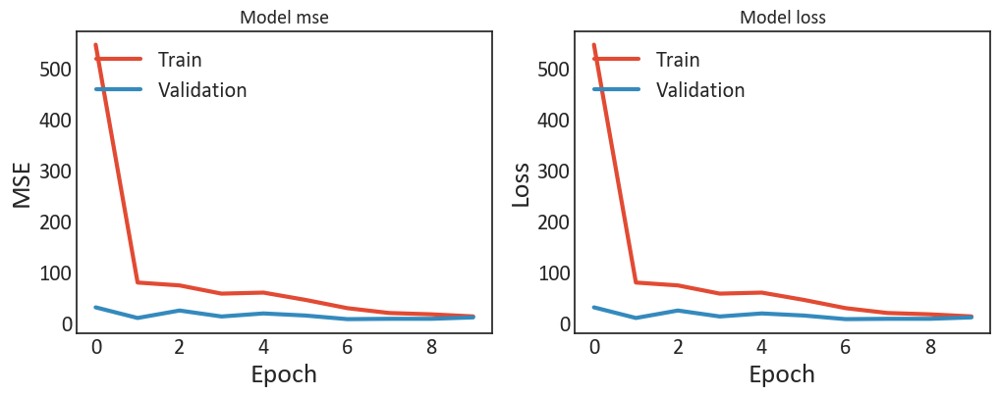

In [79]:
# plot training and validation mse
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.title('Model mse')
plt.ylabel('MSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# plot training and validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [80]:
# evaluate the model predictions
y_pred = hybrid_model.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

383/383 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Mean squared error: 9.73
Mean absolute error: 2.05
R2 score: 0.99
Mean absolute percentage error: 0.05


In [81]:
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

Root Mean Squared Error: 3.12


## HYPER-PARAMETER TUNING WITH OPTUNA

In [82]:
def objective(trial):
    num_units = trial.suggest_int('num_units', 64, 256, step=64)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-4, 1e-2)
    
    # ANN Branch
    ann_branch = layers.Dense(num_units, activation='relu')(input_layer)
    ann_branch = layers.Dropout(dropout_rate)(ann_branch)
    
    # CNN Branch
    cnn_branch = layers.Conv1D(filters=128, kernel_size=3, activation='relu')(cnn_input)
    cnn_branch = layers.Flatten()(cnn_branch)
    
    # Merge ANN and CNN branches
    merged = layers.concatenate([ann_branch, cnn_branch])
    
    # Output layer
    output = layers.Dense(1)(merged)
    
    # Compile model
    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer=AdamW(learning_rate=learning_rate), loss='mse', metrics=['mse'])
    
    # Train model
    history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_val, y_val), verbose=0)
    
    return min(history.history['val_loss'])

In [83]:
import optuna

In [88]:
# Run Optuna Study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)
print(study.best_params)

[I 2025-02-12 19:23:41,616] A new study created in memory with name: no-name-70663c35-1988-4b62-bc1d-279bbb474acb
[I 2025-02-12 19:25:16,451] Trial 0 finished with value: 2.3939788341522217 and parameters: {'num_units': 192, 'dropout_rate': 0.14773662125243572, 'learning_rate': 0.0008498001940017027}. Best is trial 0 with value: 2.3939788341522217.
[I 2025-02-12 19:26:38,193] Trial 1 finished with value: 2.0931899547576904 and parameters: {'num_units': 64, 'dropout_rate': 0.10070791421431871, 'learning_rate': 0.003917738653063039}. Best is trial 1 with value: 2.0931899547576904.
[I 2025-02-12 19:27:53,447] Trial 2 finished with value: 3.369232177734375 and parameters: {'num_units': 256, 'dropout_rate': 0.27750742663294714, 'learning_rate': 0.00018168001802556865}. Best is trial 1 with value: 2.0931899547576904.
[I 2025-02-12 19:29:08,516] Trial 3 finished with value: 2.336287021636963 and parameters: {'num_units': 256, 'dropout_rate': 0.4619623492664301, 'learning_rate': 0.000636381937

{'num_units': 64, 'dropout_rate': 0.19454335735261302, 'learning_rate': 0.004960266021673757}


In [89]:
best_params = study.best_params
print(best_params)

{'num_units': 64, 'dropout_rate': 0.19454335735261302, 'learning_rate': 0.004960266021673757}


#### REBUILD MODEL WITH BEST PARAMS

In [90]:
# Define input shape 
num_features = X_train.shape[1]

# Shared Input for both ANN and CNN
input_layer = Input(shape=(num_features,))

# ANN Branch
ann_branch = layers.Dense(128, activation='relu')(input_layer)
ann_branch = layers.BatchNormalization()(ann_branch)
ann_branch = layers.Dropout(0.3)(ann_branch)
ann_branch = layers.Dense(64, activation='relu')(ann_branch)
ann_branch = layers.Dense(32, activation='relu')(ann_branch)

# CNN Branch
cnn_input = layers.Reshape((num_features, 1))(input_layer)  # Reshape for Conv1D
cnn_branch = layers.Conv1D(filters=256, kernel_size=3, activation='relu')(cnn_input)
cnn_branch = layers.MaxPool1D(pool_size=2)(cnn_branch)
cnn_branch = layers.Conv1D(filters=128, kernel_size=3, activation='relu')(cnn_branch)
cnn_branch = layers.MaxPool1D(pool_size=2)(cnn_branch)
cnn_branch = layers.Conv1D(filters=64, kernel_size=3, activation='relu')(cnn_branch)
cnn_branch = layers.Flatten()(cnn_branch)
cnn_branch = layers.Dense(128, activation='relu')(cnn_branch)

In [91]:
# Merge ANN and CNN branches
merged = layers.concatenate([ann_branch, cnn_branch])

# Output layer for regression
output = layers.Dense(1)(merged)

In [92]:
# compile the best params
optimized_model = Model(inputs=input_layer, outputs=output)
optimizer = AdamW(learning_rate=best_params['learning_rate'], weight_decay=1e-4)
optimized_model.compile(optimizer=optimizer, loss='mse', metrics=['mse'])

In [93]:
# Model Summary
optimized_model.summary()

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)    │ (None, 38)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ reshape_1 (Reshape)           │ (None, 38, 1)             │               0 │ input_layer_4[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1d_26 (Conv1D)            │ (None, 36, 256)           │           1,024 │ reshape_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling1d_4               │ (None, 18, 256)           │               0 │ conv1d_26[0][0]            │
│ (MaxPooling1D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_53 (Dense)              │ (None, 128)               │           4,992 │ input_layer_4[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1d_27 (Conv1D)            │ (None, 16, 128)           │          98,432 │ max_pooling1d_4[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_2         │ (None, 128)               │             512 │ dense_53[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling1d_5               │ (None, 8, 128)            │               0 │ conv1d_27[0][0]            │
│ (MaxPooling1D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_23 (Dropout)          │ (None, 128)               │               0 │ batch_normalization_2[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1d_28 (Conv1D)            │ (None, 6, 64)             │          24,640 │ max_pooling1d_5[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_54 (Dense)              │ (None, 64)                │           8,256 │ dropout_23[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_22 (Flatten)          │ (None, 384)               │               0 │ conv1d_28[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_55 (Dense)              │ (None, 32)                │           2,080 │ dense_54[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_56 (Dense)              │ (None, 128)               │          49,280 │ flatten_22[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ concatenate_21 (Concatenate)  │ (None, 160)               │               0 │ dense_55[0][0],            │
│                               │                           │                 │ dense_56[0][0]             │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 189,377 (739.75 KB)

 Trainable params: 189,121 (738.75 KB)

 Non-trainable params: 256 (1.00 KB)

In [94]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

In [95]:
history = optimized_model.fit(
    X_train, y_train,
    epochs=20, batch_size=64,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, lr_scheduler]
)

Epoch 1/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 910.8215 - mse: 910.8215 - val_loss: 19.6677 - val_mse: 19.6677 - learning_rate: 0.0050
Epoch 2/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 91.5444 - mse: 91.5444 - val_loss: 17.7075 - val_mse: 17.7075 - learning_rate: 0.0050
Epoch 3/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - loss: 83.8450 - mse: 83.8450 - val_loss: 19.8053 - val_mse: 19.8053 - learning_rate: 0.0050
Epoch 4/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 67.4857 - mse: 67.4857 - val_loss: 10.5867 - val_mse: 10.5867 - learning_rate: 0.0050
Epoch 5/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - loss: 48.2700 - mse: 48.2700 - val_loss: 8.3684 - val_mse: 8.3684 - learning_rate: 0.0050
Epoch 6/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 31.6286 - mse: 31.6286 - val_loss: 24.2867 - val_mse: 24.2867 - learning_rate: 0.0050
Epoch 7/20
575/575 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 21.8747 - mse: 21.8747 - val_loss: 7.1930 - val_ms

#### PLOT LOSS AND MSE TREND FOR BEST PARAMS

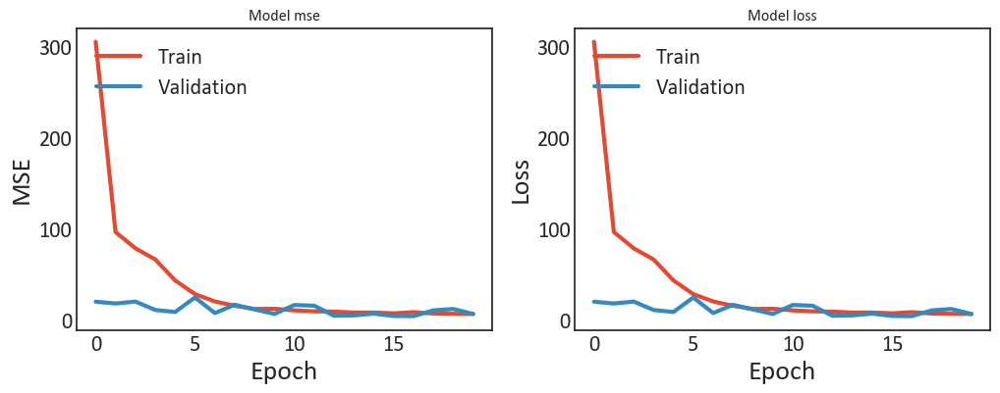

In [96]:
# plot training and validation mse
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.title('Model mse')
plt.ylabel('MSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# plot training and validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [97]:
# evaluate the model predictions
y_pred = optimized_model.predict(X_test)

# evaluate the model accuracy
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean squared error: {mse:.2f}")
print(f"Mean absolute error: {mae:.2f}")
print(f"R2 score: {r2:.2f}")
print(f"Mean absolute percentage error: {mape:.2f}")

383/383 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Mean squared error: 3.45
Mean absolute error: 1.09
R2 score: 1.00


In [98]:
print('Root Mean Squared Error: '+ "{:.2f}".format(mean_squared_error(y_test,y_pred)**0.5))

Root Mean Squared Error: 1.86
